# Minneapolis Crime Data Exploration & Analysis

- Author: Jay Bennett
- Created on: September 4, 2021
- Description: Data analysis, exploration & visualization on crime incidents in Minneapolis


In [139]:
# # Import necessary packages
# #import os
# import warnings
# import pandas as pd
# import numpy as np
# import folium
# from folium import plugins
# from folium.plugins import MarkerCluster
# import seaborn as sns
# import matplotlib.pyplot as plt
# from datetime import datetime

# warnings.filterwarnings('ignore')
# %matplotlib inline

# # Set pandas's max row display
# pd.set_option('display.max_row', 1000)

# # Set pandas's max column width to 50
# pd.set_option('display.max_columns', 50)

# # Set Seaborn style to default
# sns.set_style('darkgrid')

# title_font_size = 14
# x_axis_font_size = 12
# y_axis_font_size = 12

In [140]:
def import_pims_data(path):
    '''Import files in 2018-present format'''
    df = pd.read_csv(path, parse_dates=['beginDate'])
    df['beginTimeNew']  = convertIntToTime(df['beginTime'])
    df['Dates'] = pd.to_datetime(df['beginDate'].dt.date.astype(str) + df['beginTimeNew'].astype(str), format = '%Y-%m-%d%H:%M:%S')
    df.drop(columns={'X', 'Y', 'caseNumber','reportedDate', 'reportedTime', 'beginDate', 'reportedDateTime', 'beginTime', 'enteredDate', 'centergbsid', 'centerX', 'centerY', 'lastchanged', 'LastUpdateDateETL',  'OBJECTID', 'beginTimeNew'}, inplace=True)
    df.rename(columns={'publicaddress':'Address','centerLat': 'Lat', 'centerLong': 'Long', 'description': 'Description', 'offense': 'Offense', 'precinct': 'Precinct', 'reportedDateTime': 'ReportedDateTime', 'neighborhood': 'Neighborhood'}, inplace=True)
    df = df[['Dates','Address', 'Lat', 'Long', 'Neighborhood', 'Precinct', 'Offense', 'Description', 'UCRCode']] 
    #df['UCRCode'] =df['UCRCode'].astype(int).where.notN
    df['Dates'] = pd.to_datetime(df['Dates'], utc=False)
    return df

def convertIntToTime(t):
    s = t.astype(str).str.zfill(4) + '00'
    return pd.to_datetime(s.str[:2] + ':' + s.str[2:4] + ':' + s.str[4:]).dt.time

folder = 'mpls_data/mpls_police_data/'

c18 = import_pims_data(folder + 'police_incidents_2018_pims.csv')
c19 = import_pims_data(folder + 'police_incidents_2019_pims.csv')
c20 = import_pims_data(folder + 'police_incidents_2020_pims.csv')
c21 = import_pims_data(folder + 'police_incidents_2021_pims.csv')

frames = [c18, c19, c20, c21]
df_pims = pd.concat(frames)

df_pims.head()
df_pims.info

<bound method DataFrame.info of                     Dates                 Address        Lat       Long  \
0     2018-06-05 20:00:00         0012XX YALE PL   44.972645 -93.279485   
1     2018-06-07 12:10:00        0001XX LAKE ST W  44.948347 -93.280523   
2     2018-06-07 17:37:00  0003XX NICOLLET MALL    44.980281 -93.269393   
3     2018-06-07 21:00:00        0041XX 3RD AVE S  44.927773 -93.272738   
4     2018-06-07 13:30:00         00003X 9TH ST N  44.976774 -93.277360   
...                   ...                     ...        ...        ...   
14343 2021-06-21 21:00:00   0045XX MINNEHAHA AVE   44.920621 -93.215306   
14344 2021-06-21 22:00:00         0003XX 1ST ST N  44.986581 -93.270715   
14345 2021-06-22 13:30:00   00002X FRANKLIN AVE E  44.962689 -93.277185   
14346 2021-06-18 20:20:00     0026XX DUPONT AVE S  44.954645 -93.293151   
14347 2021-06-20 23:30:00       0052XX 40TH AVE S  44.908098 -93.215215   

          Neighborhood Precinct   Offense                     Descr

In [141]:
def import_caprs_data(path):
    '''Import files in 2010-2018 format'''
    #df = []
    df = pd.read_csv(path)
    #df.drop(columns={'caseNumber','reportedDate', 'reportedTime', 'beginDate', 'beginTime', 'enteredDate', 'centergbsid', 'centerX', 'centerY', 'lastchanged', 'LastUpdateDateETL',  'OBJECTID', 'beginTimeNew'}, inplace=True)
    df.drop(columns={'FID', 'ControlNbr', 'CCN', 'ReportedDate', 'Time', 'EnteredDate', 'GBSID', 'X', 'Y', 'LastChanged', 'LastUpdateDate' }, inplace=True)
    df.rename(columns={'BeginDate':'Dates', 'PublicAddress': 'Address'}, inplace=True)
    df = df[['Dates','Address', 'Lat', 'Long', 'Neighborhood', 'Precinct', 'Offense', 'Description', 'UCRCode']]
    #print(df.columns)
    df['Dates'] = pd.to_datetime(df['Dates'], utc=False)
    return df


folder = 'mpls_data/mpls_police_data/'
path = folder + 'police_incidents_2010_caprs.csv'

c10 = import_caprs_data(folder + 'police_incidents_2010_caprs.csv')
c11 = import_caprs_data(folder + 'police_incidents_2011_caprs.csv')
c12 = import_caprs_data(folder + 'police_incidents_2012_caprs.csv')
c13 = import_caprs_data(folder + 'police_incidents_2013_caprs.csv')
c14 = import_caprs_data(folder + 'police_incidents_2014_caprs.csv')
c15 = import_caprs_data(folder + 'police_incidents_2015_caprs.csv')
c16 = import_caprs_data(folder + 'police_incidents_2016_caprs.csv')
c17 = import_caprs_data(folder + 'police_incidents_2017_caprs.csv')
c18 = import_caprs_data(folder + 'police_incidents_2018_caprs.csv')

frames = [c10, c11, c12, c13, c14, c15, c16, c17, c18]
df_caprs = pd.concat(frames)

df_caprs.head()

,Dates,Address,Lat,Long,Neighborhood,Precinct,Offense,Description,UCRCode
0,2010-01-01 00:30:00,0056XX Lyndale AV S,44.900291,-93.288239,WINDOM,5.0,CSCR,Crim Sex Cond-rape,3
1,2010-01-01 01:05:00,0001XX 62 ST W,44.890636,-93.280041,WINDOM,5.0,ROBPAG,Robbery Per Agg,4
2,2010-01-01 04:18:00,0039XX 5 AV S,44.931448,-93.268841,BRYANT,3.0,BURGD,Burglary Of Dwelling,6
3,2010-01-01 03:00:00,0013XX Nicollet AV S,44.970506,-93.277714,LORING PARK,1.0,ASLT2,Asslt W/dngrs Weapon,5
4,2010-01-01 02:23:00,0034XX Oliver AV N,45.017746,-93.306988,FOLWELL,4.0,BURGD,Burglary Of Dwelling,6


In [142]:
# concatenate df's together and 
frames = [df_caprs, df_pims]
df = pd.concat(frames)
df.head()

,Dates,Address,Lat,Long,Neighborhood,Precinct,Offense,Description,UCRCode
0,2010-01-01 00:30:00,0056XX Lyndale AV S,44.900291,-93.288239,WINDOM,5.0,CSCR,Crim Sex Cond-rape,3.0
1,2010-01-01 01:05:00,0001XX 62 ST W,44.890636,-93.280041,WINDOM,5.0,ROBPAG,Robbery Per Agg,4.0
2,2010-01-01 04:18:00,0039XX 5 AV S,44.931448,-93.268841,BRYANT,3.0,BURGD,Burglary Of Dwelling,6.0
3,2010-01-01 03:00:00,0013XX Nicollet AV S,44.970506,-93.277714,LORING PARK,1.0,ASLT2,Asslt W/dngrs Weapon,5.0
4,2010-01-01 02:23:00,0034XX Oliver AV N,45.017746,-93.306988,FOLWELL,4.0,BURGD,Burglary Of Dwelling,6.0


In [143]:
# check for duplicate records
df.duplicated(subset=None, keep='first').sum()
#df.shape

1161

## Data Cleaning/Pre-processing


In [144]:
# strip date and time and hour from timestamp
df['Time'] = df['Dates'].apply( lambda d : d.time() )
df['Date'] = df['Dates'].apply( lambda d : d.date() )
df['Year'] = df['Dates'].apply( lambda d : d.year)
df['Month'] = df['Dates'].apply( lambda d : d.month)
df['Month_Name'] = df['Dates'].apply( lambda d : d.strftime('%B'))
df['DayOfWeek_Num'] = df['Dates'].apply( lambda d : d.dayofweek)
df['DayOfWeek'] = df['Dates'].dt.day_name()
df['Hour'] = df['Dates'].apply( lambda d : d.hour)

# make date a date char type
df['Date'] = pd.to_datetime(df['Date'])

# remove whitespace from Offense and Precinct
df['Offense'] = df['Offense'].str.strip()

# remove punctuation from neighborhood column
df['Neighborhood'] = df['Neighborhood'].str.replace(r"[\"\',]", '')

# remove na's (exist in precinct and neighborhood)
df = df.dropna()

# remove UI, 18 and 99 from precinct
df = df[df.Precinct != 'UI    ']
df = df[df.Precinct != 18]
df = df[df.Precinct != 99]

# convert precinct column to int
df['Precinct'] = df['Precinct'].astype(int)

# convert neighborhood to upper
df['Neighborhood'] = df['Neighborhood'].str.upper()

df['UCRCode'] = df['UCRCode'].astype(int)

df_incidents = df[['Dates', 'Address', 'Long', 'Lat', 'Neighborhood', 'Precinct', 'Offense', 'Description', 'UCRCode', 'DayOfWeek']]

df_incidents.head()

,Dates,Address,Long,Lat,Neighborhood,Precinct,Offense,Description,UCRCode,DayOfWeek
0,2010-01-01 00:30:00,0056XX Lyndale AV S,-93.288239,44.900291,WINDOM,5,CSCR,Crim Sex Cond-rape,3,Friday
1,2010-01-01 01:05:00,0001XX 62 ST W,-93.280041,44.890636,WINDOM,5,ROBPAG,Robbery Per Agg,4,Friday
2,2010-01-01 04:18:00,0039XX 5 AV S,-93.268841,44.931448,BRYANT,3,BURGD,Burglary Of Dwelling,6,Friday
3,2010-01-01 03:00:00,0013XX Nicollet AV S,-93.277714,44.970506,LORING PARK,1,ASLT2,Asslt W/dngrs Weapon,5,Friday
4,2010-01-01 02:23:00,0034XX Oliver AV N,-93.306988,45.017746,FOLWELL,4,BURGD,Burglary Of Dwelling,6,Friday


In [145]:
# # Load in just the training set
# #df = pd.read_csv('train.csv')
# import os
# path = os.getcwd()
# print(path)
# #/Users/jaybennett/Documents/GitHub/kaggle-sf-crime/minneapolis_incidents.csv
# #/Users/jaybennett/Documents/GitHub/kaggle-sf-crime/minneapolis_minneapolis_incidents.csv'
# df = pd.read_csv(path + '/minneapolis_incidents.csv')
# #df['date'] = pd.date_range('2000-1-1', periods=200, freq='D')
# mask = (df['Dates'] > '2010-01-01') & (df['Dates'] <= '2020-12-31')
# print(df.loc[mask])

# #df.rename(columns={'ReportedDateTime':'Dates', 'Offense':'Offense', 'DoW':'DayOfWeek'}, inplace=True)

In [146]:
UCRCodes = {1 : 'MURDER', 3 : 'RAPE', 4 : 'ROBBERY', 5 : 'ASSAULT', 6 : 'BURGLARY', 7 : 'LARCENY', 8 : 'AUTO THEFT', 10 : 'ARSON'}
print(dict)
  
# Remap the values of the dataframe
df['Category']= df['UCRCode'].map(UCRCodes)
  
# Print the DataFrame after modification
df.head()

<class 'dict'>


,Dates,Address,Lat,Long,Neighborhood,Precinct,Offense,Description,UCRCode,Time,Date,Year,Month,Month_Name,DayOfWeek_Num,DayOfWeek,Hour,Category
0,2010-01-01 00:30:00,0056XX Lyndale AV S,44.900291,-93.288239,WINDOM,5,CSCR,Crim Sex Cond-rape,3,00:30:00,2010-01-01,2010,1,January,4,Friday,0,RAPE
1,2010-01-01 01:05:00,0001XX 62 ST W,44.890636,-93.280041,WINDOM,5,ROBPAG,Robbery Per Agg,4,01:05:00,2010-01-01,2010,1,January,4,Friday,1,ROBBERY
2,2010-01-01 04:18:00,0039XX 5 AV S,44.931448,-93.268841,BRYANT,3,BURGD,Burglary Of Dwelling,6,04:18:00,2010-01-01,2010,1,January,4,Friday,4,BURGLARY
3,2010-01-01 03:00:00,0013XX Nicollet AV S,44.970506,-93.277714,LORING PARK,1,ASLT2,Asslt W/dngrs Weapon,5,03:00:00,2010-01-01,2010,1,January,4,Friday,3,ASSAULT
4,2010-01-01 02:23:00,0034XX Oliver AV N,45.017746,-93.306988,FOLWELL,4,BURGD,Burglary Of Dwelling,6,02:23:00,2010-01-01,2010,1,January,4,Friday,2,BURGLARY


In [147]:
precincts = {1 : 'DOWNTOWN', 2 : 'NORTHEAST', 3 : 'SOUTHEAST',  4 : 'NORTH', 5 : 'SOUTHWEST'}
#print(dict)
  
# Remap the values of the dataframe
df['Precinct']= df['Precinct'].map(precincts)
  
# Print the DataFrame after modification
df.head()

,Dates,Address,Lat,Long,Neighborhood,Precinct,Offense,Description,UCRCode,Time,Date,Year,Month,Month_Name,DayOfWeek_Num,DayOfWeek,Hour,Category
0,2010-01-01 00:30:00,0056XX Lyndale AV S,44.900291,-93.288239,WINDOM,SOUTHWEST,CSCR,Crim Sex Cond-rape,3,00:30:00,2010-01-01,2010,1,January,4,Friday,0,RAPE
1,2010-01-01 01:05:00,0001XX 62 ST W,44.890636,-93.280041,WINDOM,SOUTHWEST,ROBPAG,Robbery Per Agg,4,01:05:00,2010-01-01,2010,1,January,4,Friday,1,ROBBERY
2,2010-01-01 04:18:00,0039XX 5 AV S,44.931448,-93.268841,BRYANT,SOUTHEAST,BURGD,Burglary Of Dwelling,6,04:18:00,2010-01-01,2010,1,January,4,Friday,4,BURGLARY
3,2010-01-01 03:00:00,0013XX Nicollet AV S,44.970506,-93.277714,LORING PARK,DOWNTOWN,ASLT2,Asslt W/dngrs Weapon,5,03:00:00,2010-01-01,2010,1,January,4,Friday,3,ASSAULT
4,2010-01-01 02:23:00,0034XX Oliver AV N,45.017746,-93.306988,FOLWELL,NORTH,BURGD,Burglary Of Dwelling,6,02:23:00,2010-01-01,2010,1,January,4,Friday,2,BURGLARY


## Data Exploration + Data Visualization


### View Subset of Data


In [148]:
## Print first 5 lines of dataset
df.head()

,Dates,Address,Lat,Long,Neighborhood,Precinct,Offense,Description,UCRCode,Time,Date,Year,Month,Month_Name,DayOfWeek_Num,DayOfWeek,Hour,Category
0,2010-01-01 00:30:00,0056XX Lyndale AV S,44.900291,-93.288239,WINDOM,SOUTHWEST,CSCR,Crim Sex Cond-rape,3,00:30:00,2010-01-01,2010,1,January,4,Friday,0,RAPE
1,2010-01-01 01:05:00,0001XX 62 ST W,44.890636,-93.280041,WINDOM,SOUTHWEST,ROBPAG,Robbery Per Agg,4,01:05:00,2010-01-01,2010,1,January,4,Friday,1,ROBBERY
2,2010-01-01 04:18:00,0039XX 5 AV S,44.931448,-93.268841,BRYANT,SOUTHEAST,BURGD,Burglary Of Dwelling,6,04:18:00,2010-01-01,2010,1,January,4,Friday,4,BURGLARY
3,2010-01-01 03:00:00,0013XX Nicollet AV S,44.970506,-93.277714,LORING PARK,DOWNTOWN,ASLT2,Asslt W/dngrs Weapon,5,03:00:00,2010-01-01,2010,1,January,4,Friday,3,ASSAULT
4,2010-01-01 02:23:00,0034XX Oliver AV N,45.017746,-93.306988,FOLWELL,NORTH,BURGD,Burglary Of Dwelling,6,02:23:00,2010-01-01,2010,1,January,4,Friday,2,BURGLARY


In [149]:
# Set target feature of interest
crime_categories = df['Category'].value_counts()
crime_category_names = crime_categories.index

In [150]:
df.to_csv('incidents.csv')

### What categories of crimes are most prevalent in Minneapolis between 2010 - mid 2021?

- 10 Crime Categories
- We notice that the target feature `Category` is very imbalanced with most of the occurences (around 60%) in the top 5 categories - most of it is Theft/Larceny


In [151]:
## Check if any rows are missing data and are null## Chec 
df['Category'].isnull().values.any()

False

In [152]:
## Count number of observations for each crime
df['Category'].value_counts()

LARCENY       130478
BURGLARY       45134
AUTO THEFT     23788
ASSAULT        17984
ROBBERY        16584
RAPE            3326
ARSON           1156
MURDER           367
Name: Category, dtype: int64

So, you can see that Larceny/Theft has the most occurrences.


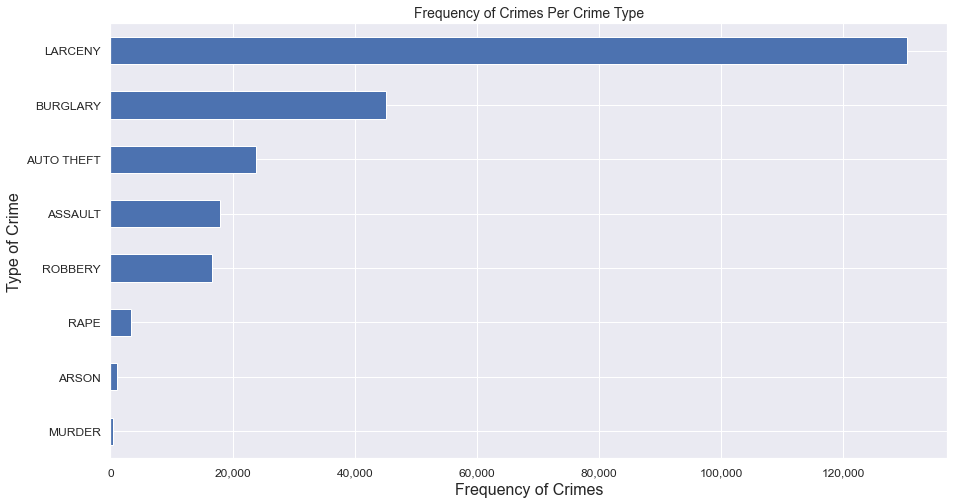

In [153]:
## Plot these for better visualization
crime_type_df = df['Category'].value_counts(ascending=True)

## Some formatting to make it look nicer
fig=plt.figure(figsize=(15, 8))
plt.title("Frequency of Crimes Per Crime Type",fontsize=title_font_size)
plt.xlabel("Frequency of Crimes", fontsize=16)
plt.ylabel("Type of Crime",fontsize=16)
ax = crime_type_df.plot(kind='barh', fontsize=12)
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

## Time Features

- Time features: Hour, Month, Year, DayofWeek
- plot line plot for each of these
- plot a distribution (histogram) for each of these


In [154]:
df['Dates'] = pd.to_datetime(df['Dates'], format='%Y-%m-%d %H:%M:%S')
df['Hour'] = df['Dates'].map(lambda x: x.hour)
df['Month'] = df['Dates'].map(lambda x: x.month)
df['Year'] = df['Dates'].map(lambda x: x.year)
df['Year-Month']= pd.to_datetime(df['Dates'], format='%Y-%m')

# df.to_csv('incidents.csv')

In [155]:
#Loop through temporal features
def lineplot_temporal_feature(df, time_feature, crime_category_names, xaxis_formatter=None, xtick_inc=None):
    
    # Set figure size
    fig = plt.figure(figsize=(50, 100))
    
    for i in range(len(crime_category_names)):
        p = plt.subplot(10, 4, i+1)
        crime = crime_category_names[i]
        cur_crime_data = df[df.Category == crime]
        temporal_data = cur_crime_data[time_feature].value_counts().sort_index()
        sns.lineplot(data=temporal_data)
        if xtick_inc:
            plt.xticks(np.arange(df[time_feature].unique().min(),df[time_feature].unique().max()+1, xtick_inc))
        plt.tick_params(axis = 'both', which = 'major', labelsize = 13)
        if xaxis_formatter:
            p.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: xaxis_formatter(x)))
        plt.ylabel("Frequency of Crime", fontsize=y_axis_font_size)
        time_feature_str = str(time_feature).capitalize()
        plt.xlabel(time_feature_str, fontsize=x_axis_font_size)
        plt.title("%s (%s)" % (crime, 'per '+ time_feature_str), fontsize=title_font_size)


In [156]:
#Loop through temporal features
def distplot_temporal_feature(df, time_feature, crime_category_names, xaxis_formatter=None, xtick_inc=None):
    
    # Set figure size
    fig = plt.figure(figsize=(50, 100))
    
    for i in range(len(crime_category_names)):
        p = plt.subplot(10, 4, i+1)
        crime = crime_category_names[i]
        cur_crime_data = df[df.Category == crime]
        temporal_data = cur_crime_data[time_feature].value_counts().sort_index()
        sns.distplot(temporal_data, kde=False, bins= 12)
        if xtick_inc:
            plt.xticks(np.arange(df[time_feature].unique().min(),df[time_feature].unique().max()+1, xtick_inc))
        plt.tick_params(axis = 'both', which = 'major', labelsize = 13)
        if xaxis_formatter:
            #p.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: xaxis_formatter(x)))
            p.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
        plt.ylabel("Frequency of Crime", fontsize=y_axis_font_size)
        time_feature_str = str(time_feature).capitalize()
        plt.xlabel(time_feature_str, fontsize=x_axis_font_size)
        plt.title("%s (%s)" % (crime, 'per '+ time_feature_str), fontsize=title_font_size)

    #fig.savefig('visualizations/%s.png' % time_feature_str, bbox_inches='tight')

### Distribution of Crime over 24 hours

- First plot all crimes over 24 hours
- Then plot per category over 24 hours


In [157]:
def convert_time(hour):
    d = datetime.strptime(str(hour), "%H")
    return d.strftime("%I:%M %p")

In [158]:
## Group dataset by crime occurences and time

# crime_per_time = pd.to_datetime(df['Dates'], format="%Y-%m-%d %H:%M:%S").dt.hour.value_counts().sort_index()
crime_per_time = df["Hour"].value_counts().sort_index()
crime_per_time

0     23148
1      6063
2      7936
3      5869
4      2932
5      3350
6      5360
7      4055
8      8700
9      9982
10     5712
11     8119
12    14998
13     7020
14    10086
15    14329
16     8268
17    13493
18    18088
19     8646
20    13084
21    19167
22     8436
23    11976
Name: Hour, dtype: int64

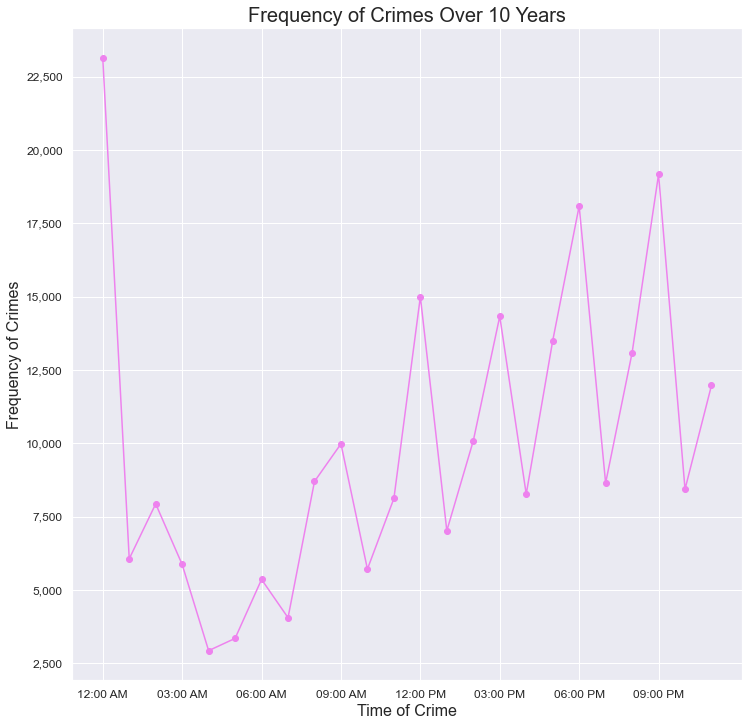

In [186]:
# Plot all crimes over the 10 years
fig=plt.figure(figsize=(12, 12))

plt.title("Frequency of Crimes Over 10 Years", fontsize=20)
plt.xlabel("Time of Crime", fontsize=16)
plt.ylabel("Frequency of Crimes", fontsize=16)

ax = crime_per_time.plot(grid=True, marker='o', color='violet', fontsize=12)

ax.set_xticks(crime_per_time.index[::3])

ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: convert_time(x)))
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))


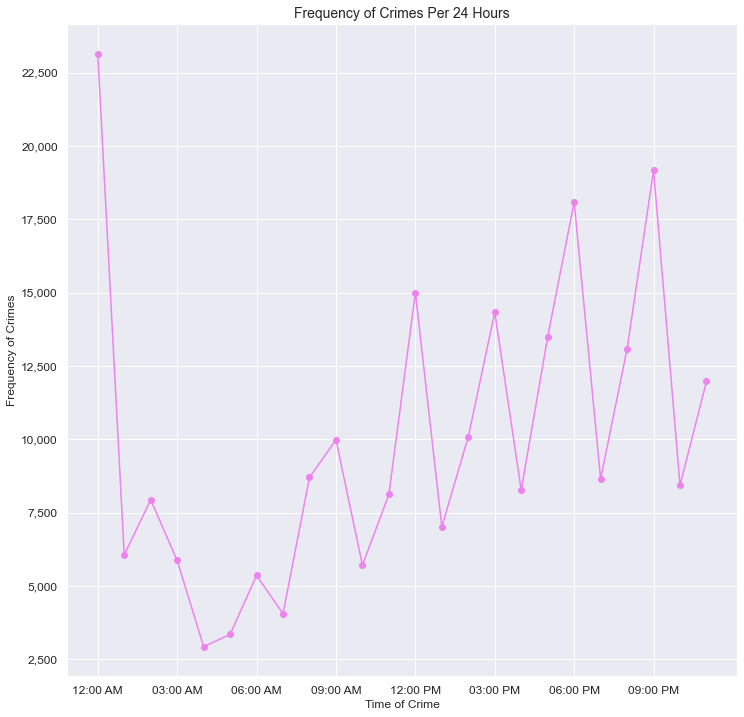

In [160]:
# Plot all crimes over the 24 hours
fig=plt.figure(figsize=(12, 12))

plt.title("Frequency of Crimes Per 24 Hours", fontsize=title_font_size)
plt.xlabel("Time of Crime", fontsize=x_axis_font_size)
plt.ylabel("Frequency of Crimes", fontsize=y_axis_font_size)

ax = crime_per_time.plot(grid=True, marker='o', color='violet', fontsize=12)

ax.set_xticks(crime_per_time.index[::3])

ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: convert_time(x)))
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

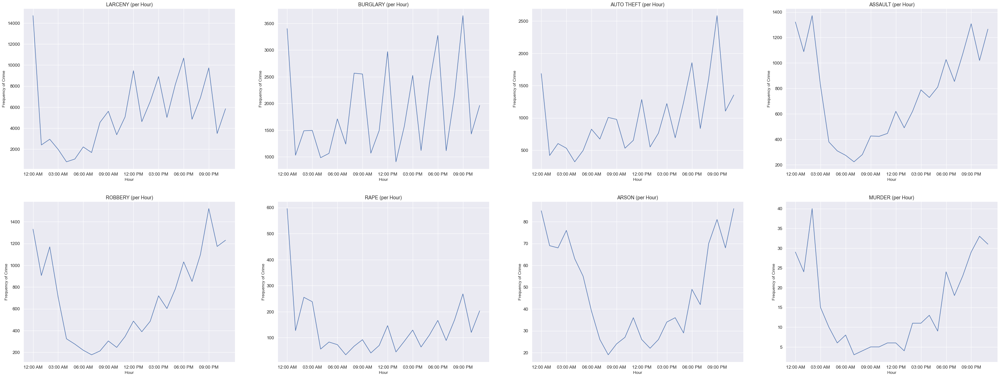

In [161]:
lineplot_temporal_feature(df, 'Hour', crime_category_names, convert_time, xtick_inc=3)

### Distribution of Crime per Month


In [162]:
# crime_per_month = pd.to_datetime(df['Dates'], format="%Y-%m-%d %H:%M:%S").dt.month.value_counts().sort_index()
crime_per_month = df['Month'].value_counts().sort_index()
crime_per_month

1     17576
2     14804
3     17504
4     18261
5     21621
6     22085
7     24470
8     24314
9     21332
10    21049
11    18590
12    17211
Name: Month, dtype: int64

In [163]:
# Used to convert month numbers to month names
import calendar

def convert_month(num):
    return calendar.month_abbr[num]
    

In [164]:
# sns.catplot(x="month", kind="count", palette="ch:.25", data=df)

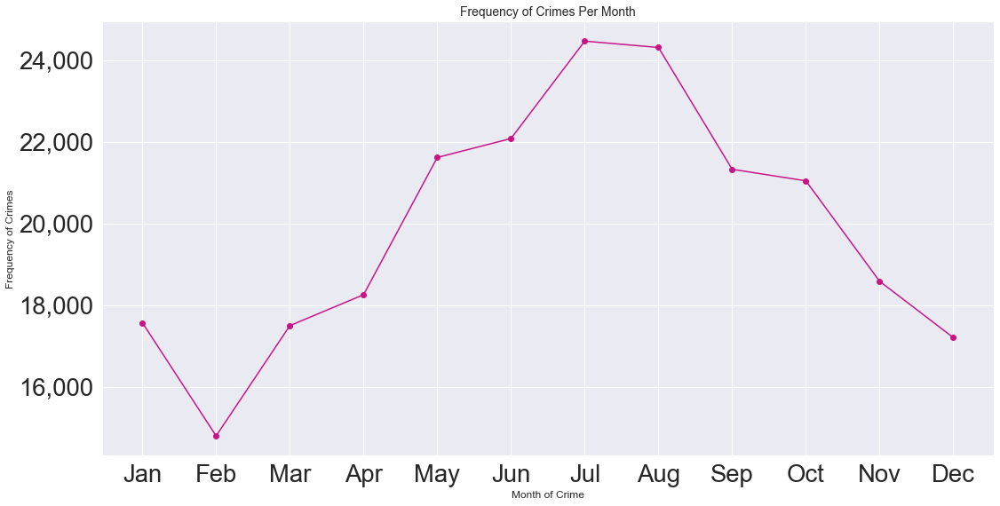

In [165]:
fig = plt.figure(figsize=(18, 9))

plt.title("Frequency of Crimes Per Month", fontsize=title_font_size)
plt.xlabel("Month of Crime", fontsize=x_axis_font_size)
plt.ylabel("Frequency of Crimes", fontsize=y_axis_font_size)

ax = crime_per_month.plot(grid=True, marker='o', color='mediumvioletred')

ax.set_xticks(crime_per_month.index)
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: convert_month(x)))
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))


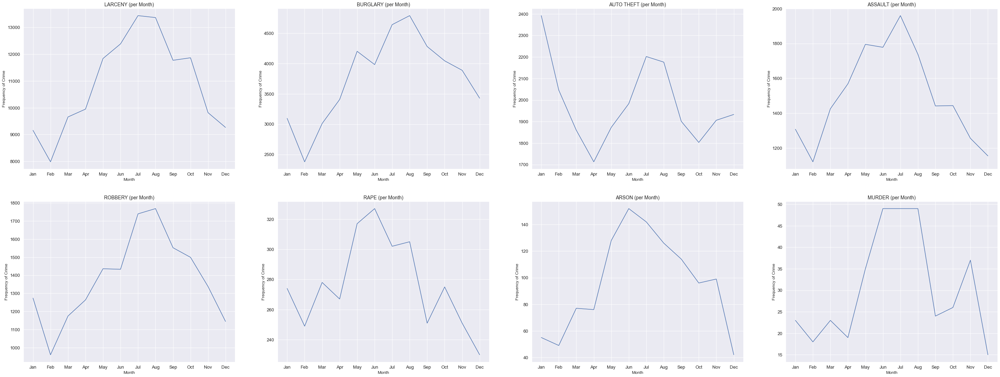

In [166]:
lineplot_temporal_feature(df, 'Month', crime_category_names, convert_month, xtick_inc=1)


### Distribution of Crimes per day of week


In [167]:
## Used to order the categories
df['DayOfWeek'] = pd.Categorical(df['DayOfWeek'], 
                                 categories=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday', 'Sunday'], 
                                 ordered=True)


crime_per_day = df['DayOfWeek'].value_counts().sort_index()
crime_per_day.index.values

['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
Categories (7, object): ['Monday' < 'Tuesday' < 'Wednesday' < 'Thursday' < 'Friday' < 'Saturday' < 'Sunday']

In [168]:
crime_per_day

Monday       33904
Tuesday      33144
Wednesday    33354
Thursday     33183
Friday       36711
Saturday     35748
Sunday       32773
Name: DayOfWeek, dtype: int64

[Text(0, 0, 'Monday'),
 Text(1, 0, 'Tuesday'),
 Text(2, 0, 'Wednesday'),
 Text(3, 0, 'Thursday'),
 Text(4, 0, 'Friday'),
 Text(5, 0, 'Saturday'),
 Text(6, 0, 'Sunday')]

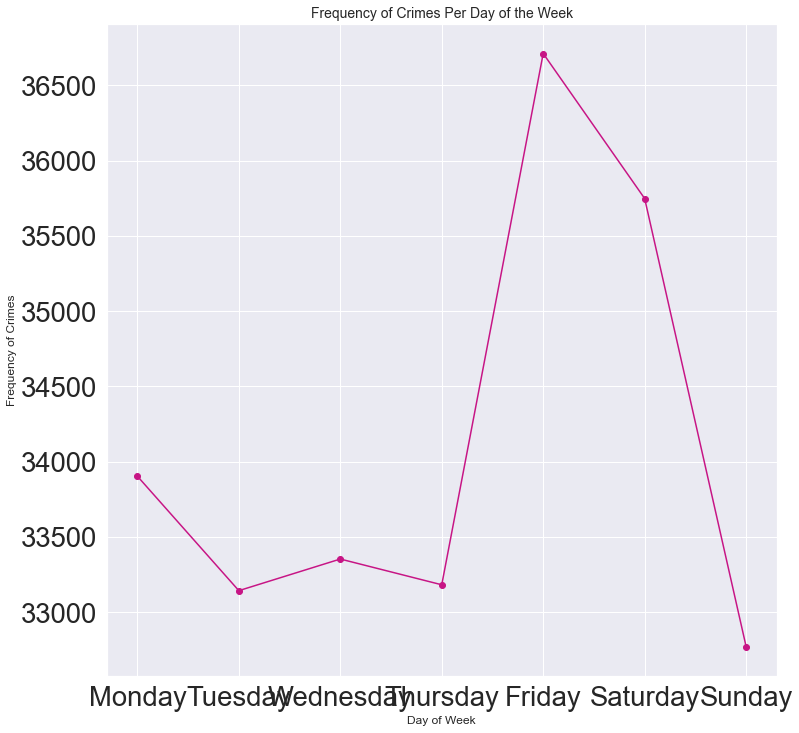

In [169]:
fig = plt.figure(figsize=(12, 12))

plt.title("Frequency of Crimes Per Day of the Week", fontsize=title_font_size)
plt.xlabel("Day of Week", fontsize=x_axis_font_size)
plt.ylabel("Frequency of Crimes", fontsize=y_axis_font_size )

#ax = crime_per_day.plot(kind='bar', color='mediumvioletred')
ax = crime_per_day.plot(grid=True, marker='o', color='mediumvioletred')

# Quick Note for string X tick labels:
# .set_xticks() on the axes will set the locations and set_xticklabels() will set the displayed text.
ax.set_xticks([0, 1, 2, 3, 4, 5, 6])
ax.set_xticklabels(crime_per_day.index)

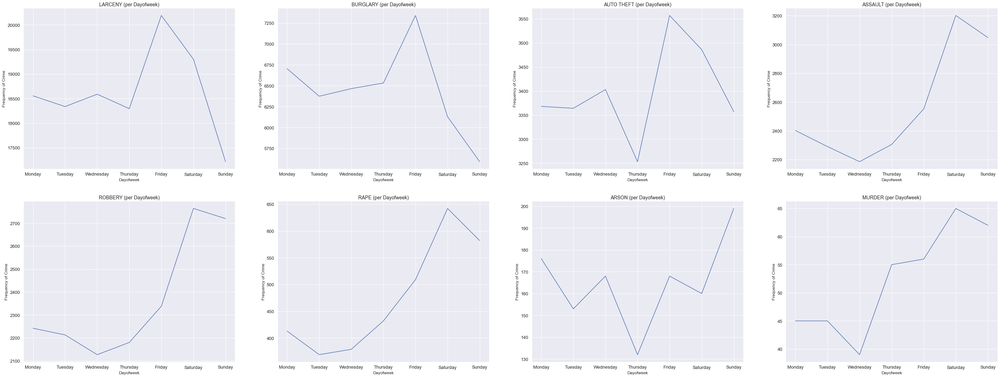

In [170]:
lineplot_temporal_feature(df, 'DayOfWeek', crime_category_names, None, None)

### Distribution of Crimes per Year


In [171]:
crime_per_year = df["Year"].value_counts().sort_index()
crime_per_year

2010    20541
2011    21684
2012    21937
2013    21720
2014    21497
2015    19960
2016    20059
2017    21628
2018    17122
2019    20139
2020    20765
2021    11765
Name: Year, dtype: int64

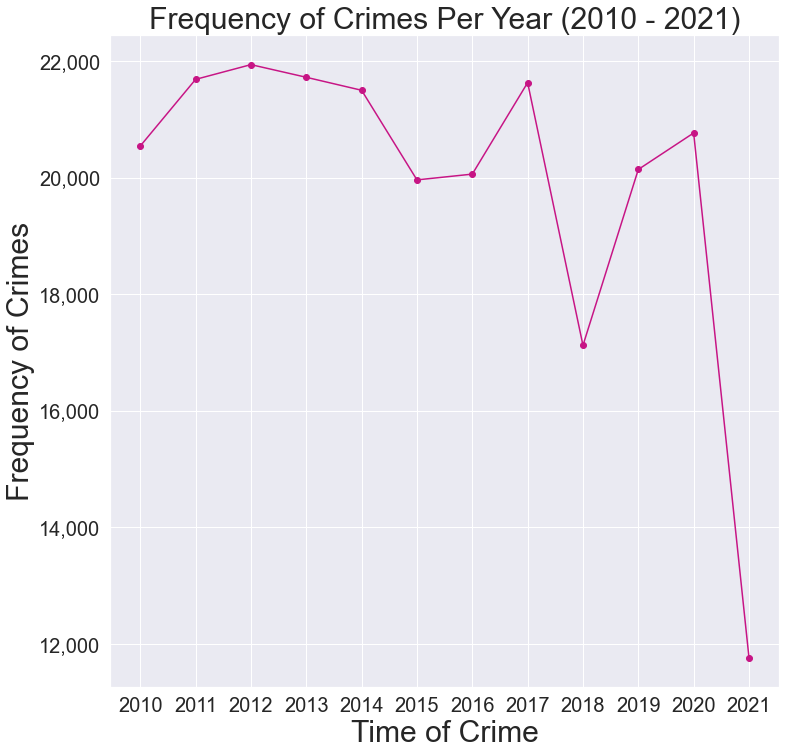

In [172]:
# Plot all crimes over the 24 hours
fig=plt.figure(figsize=(12, 12))

plt.title("Frequency of Crimes Per Year (2010 - 2021)")
plt.xlabel("Time of Crime")
plt.ylabel("Frequency of Crimes")

ax = crime_per_year.plot(grid=True, marker='o', color='mediumvioletred', fontsize=20)

ax.set_xticks(crime_per_year.index)

ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

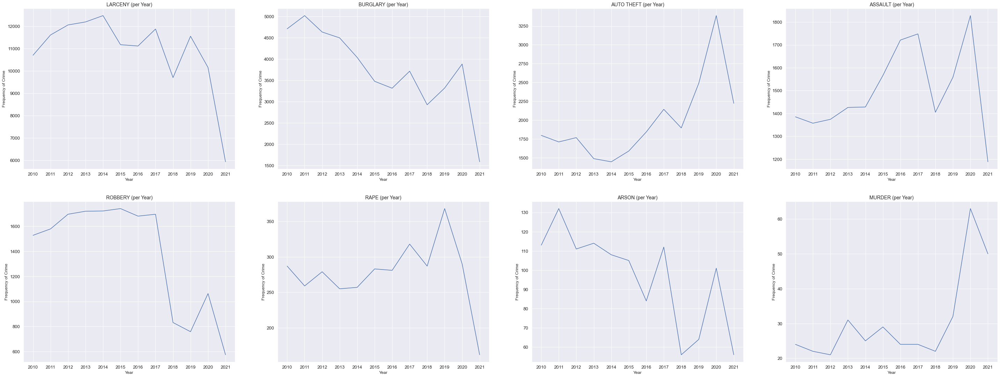

In [173]:
lineplot_temporal_feature(df, 'Year', crime_category_names, None, xtick_inc=1)

## Histogram Plots

- plot distributions of each crime using histograms and seaborn's FacetGrid


In [174]:
# Set up some seaborn parameters
sns.set(font_scale=2.5)

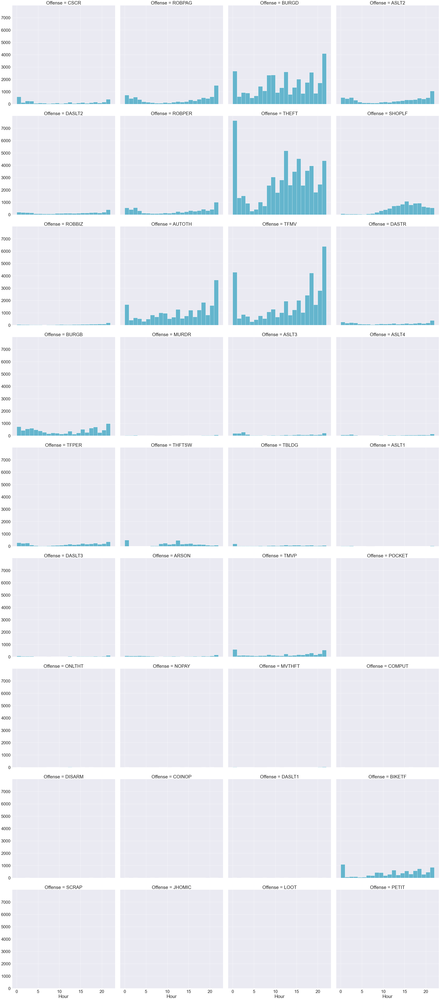

In [187]:
g = sns.FacetGrid(df, col="Offense", col_wrap=4, height=10)
g = g.map(plt.hist, "Hour", bins=np.arange(0, 23), color="c")

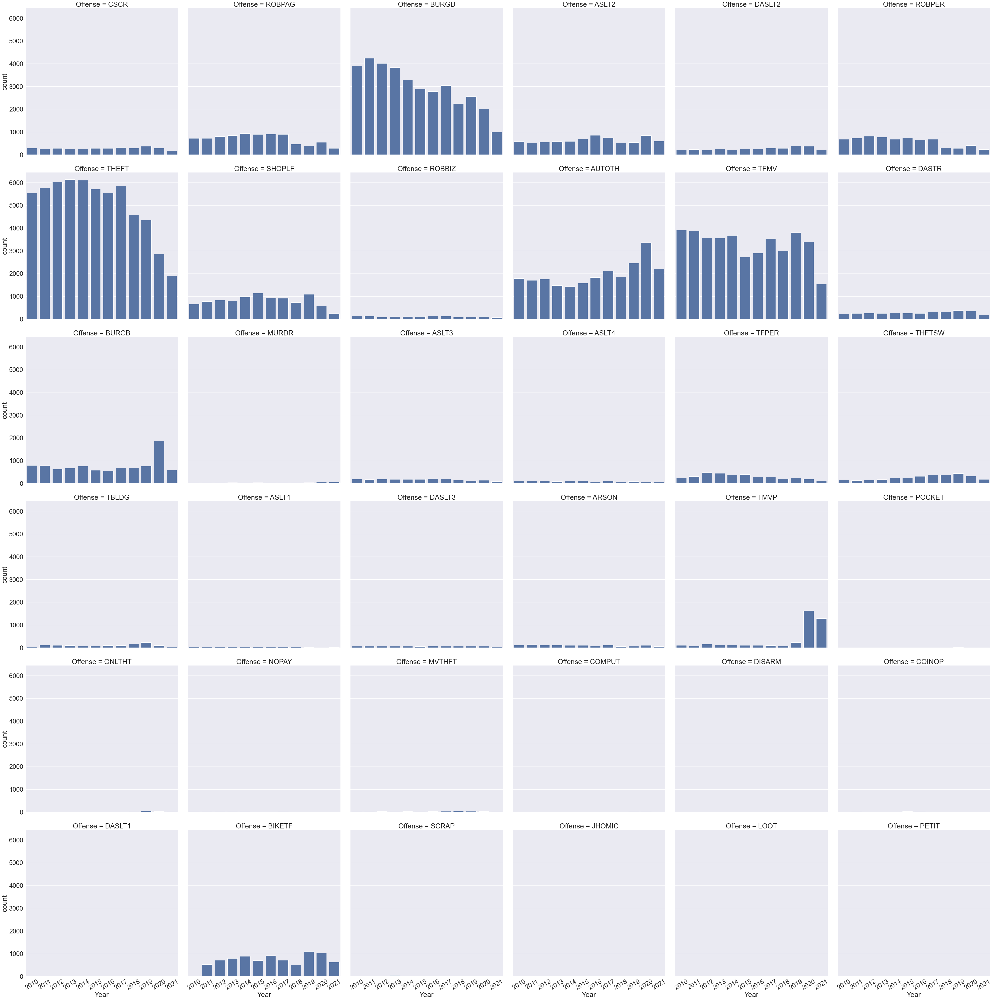

In [176]:
g = sns.FacetGrid(df, col="Offense", col_wrap=6, height=10)
g = g.map(sns.countplot, "Year", order=np.sort(df['Year'].unique()))
g.set_xticklabels(rotation=30)

In [177]:
# # Count of offenses per month
# g = sns.FacetGrid(df, col="Offense", col_wrap=6, height=10)
# g = g.map(sns.countplot, "Month", order=np.sort(df['Month'].unique()))

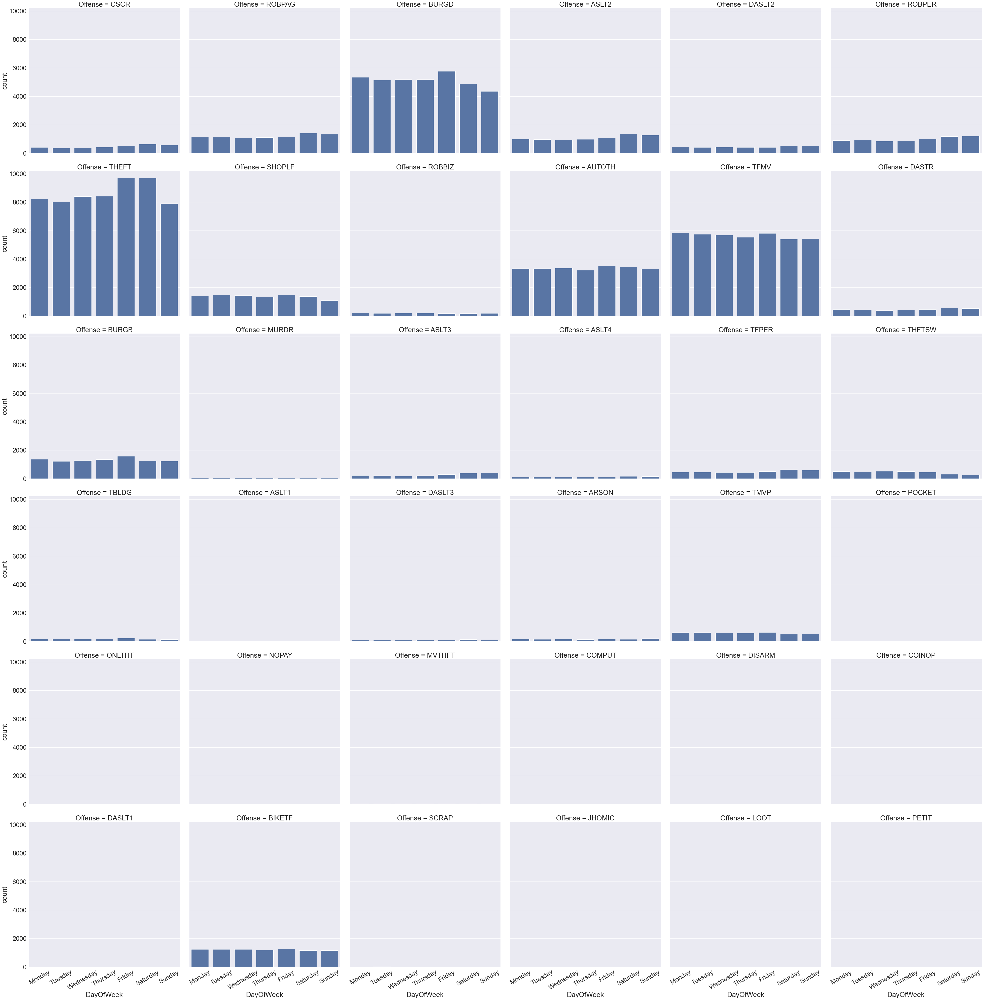

In [178]:
g = sns.FacetGrid(df, col="Offense", col_wrap=6, height=10)
g = g.map(sns.countplot, "DayOfWeek", order=df['DayOfWeek'].sort_values().unique())
g.set_xticklabels(rotation=30)

# Spatial Features


In [179]:
def plot_long_lat_map(df, crime_category_names):
    
    # Set figure size
    fig = plt.figure(figsize=(50, 100))
    
    for i in range(len(crime_category_names)):
        p = plt.subplot(10, 4, i+1)
        crime = crime_category_names[i]
        cur_crime_data = df[df.Category == crime]
        plt.title(crime + " locations")
        p.scatter(cur_crime_data.Long, cur_crime_data.Lat, alpha = 0.01)
        plt.xlabel("Longitude", fontsize=25)
        plt.ylabel('Latitude', fontsize=25)
#         p.set_xticklabels(rotation=30)
        plt.title("%s %s" % (crime, 'locations'), fontsize=30)
    
    #fig.savefig('visualizations/minneapolis_crime_locations_per_category_map.png', bbox_inches='tight')

### Distribution of Crime Per Precinct

- plot all crimes with a barplot.
- plot specific categories of crime with a heatplot.


In [180]:
crime_per_pd = df['Precinct'].value_counts()
crime_per_pd

SOUTHEAST    64770
SOUTHWEST    48619
NORTH        46345
DOWNTOWN     44903
NORTHEAST    34180
Name: Precinct, dtype: int64

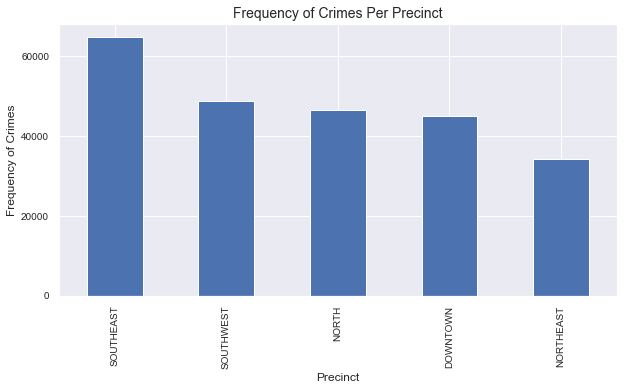

In [181]:
fig=plt.figure(figsize=(10, 5))

plt.title("Frequency of Crimes Per Precinct", fontsize=title_font_size)
plt.xlabel("Precinct", fontsize=x_axis_font_size)
plt.ylabel("Frequency of Crimes", fontsize=y_axis_font_size)

#plt.xlabel.set_xticklabels(rotation=30)

ax = crime_per_pd.plot(kind='bar',fontsize=10)


### Distribution of Crime Per Neighborhood

- plot all crimes with a barplot.
- plot specific categories of crime with a heatplot.


In [182]:
crime_per_nh = df['Neighborhood'].value_counts()
crime_per_nh

DOWNTOWN WEST                      24690
WHITTIER                           10179
MARCY HOLMES                        7474
LONGFELLOW                          7060
JORDAN                              6956
LOWRY HILL EAST                     6293
NEAR - NORTH                        6243
LORING PARK                         5417
HAWTHORNE                           5338
POWDERHORN PARK                     5254
WILLARD - HAY                       5247
SEWARD                              4938
VENTURA VILLAGE                     4706
ELLIOT PARK                         4632
MIDTOWN PHILLIPS                    4537
CENTRAL                             4464
FOLWELL                             4399
NORTH LOOP                          4393
LYNDALE                             4158
EAST PHILLIPS                       4026
CEDAR RIVERSIDE                     3891
PROSPECT PARK - EAST RIVER ROAD     3883
WEBBER - CAMDEN                     3561
CARAG                               3406
COMO            

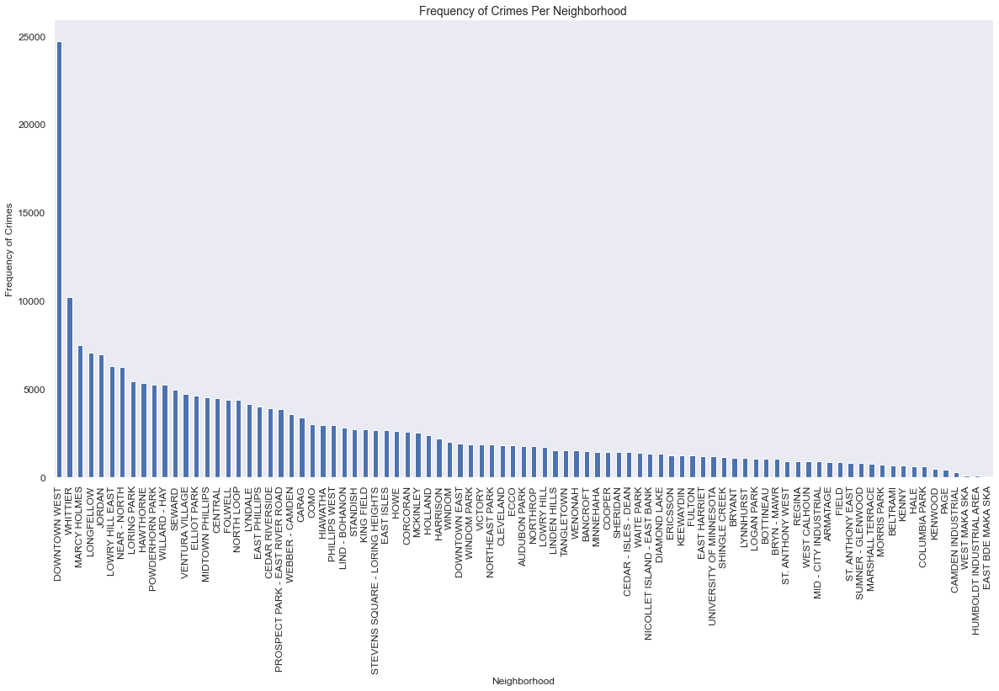

In [183]:
fig=plt.figure(figsize=(20, 10))

plt.title("Frequency of Crimes Per Neighborhood", fontsize=title_font_size)
plt.xlabel("Neighborhood", fontsize=x_axis_font_size)
plt.ylabel("Frequency of Crimes", fontsize=y_axis_font_size)

ax = crime_per_nh.plot(kind='bar',fontsize=12, grid=False)

#fig.savefig('visualizations/Neighborhood_barplot.png', bbox_inches='tight')

In [184]:
# ax.font
fig, ax = sns.heatmap(figsize=(10,10))
sns.set(font_scale=.2)
sns.heatmap(df.corr(),annot=True, ax=ax)
plt.show()

TypeError: heatmap() missing 1 required positional argument: 'data'

<AxesSubplot:>

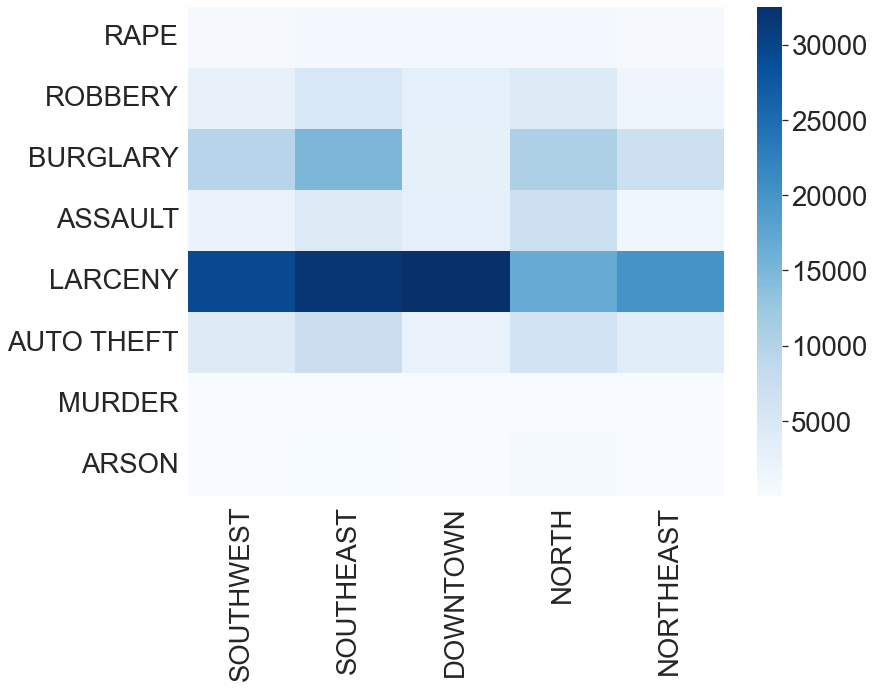

In [ ]:
# categories = df['Category'].unique()
# precincts = df['Precinct'].unique()
# tarray = []
# for cat in categories:
#     sub_array = []
#     for prec in precincts:
#         sub_array.append(len(df[(df['Precinct'] == prec) & (df['Category'] == cat)]))
#     tarray.append(sub_array)

# fig, ax = plt.subplots(1, 1, figsize =(12,9))
# #fig, ax = plt.plot(figsize =(12,9))
# heat_df = pd.DataFrame(tarray, index=categories, columns=precincts)
# sns.heatmap(heat_df, cmap='Blues')

# fig.savefig('visualizations/Precinct_per_crime_category_heatmap.png', bbox_inches='tight')

<AxesSubplot:>

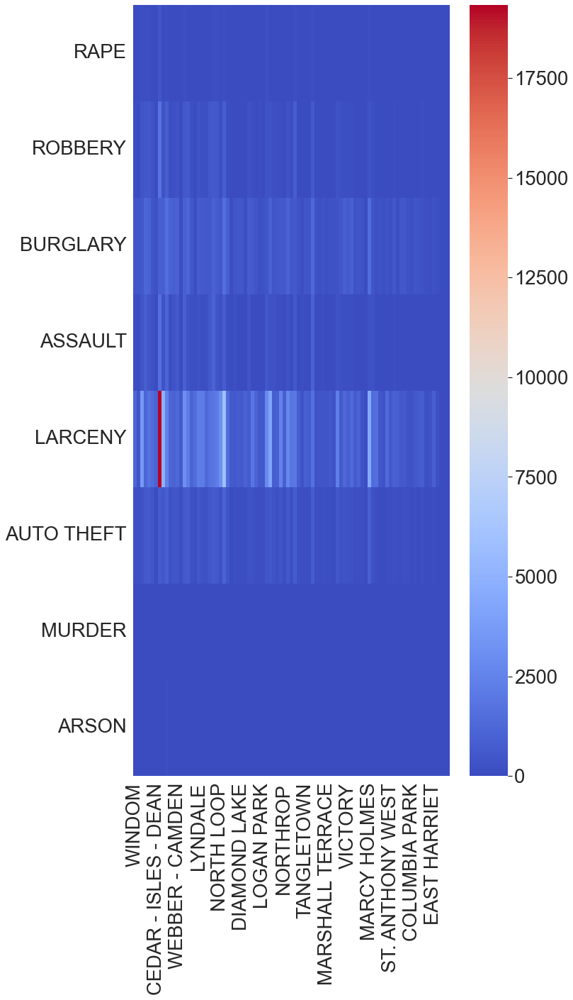

In [ ]:
categories = df['Category'].unique()
hoods = df['Neighborhood'].unique()
tarray = []
for cat in categories:
    sub_array = []
    for hood in hoods:
        sub_array.append(len(df[(df['Neighborhood'] == hood) & (df['Category'] == cat)]))
    tarray.append(sub_array)

fig, ax = plt.subplots(1, 1, figsize =(10,20))
heat_df = pd.DataFrame(tarray, index=categories, columns=hoods)
sns.heatmap(heat_df, cmap='coolwarm')

#fig.savefig('visualizations/Neighborhood_per_crime_category_heatmap.png', bbox_inches='tight')

## Data Visualization with Maps & Density Plots


### Map Visualization from Long & Lat coordinates


Text(0, 0.5, 'Latitude')

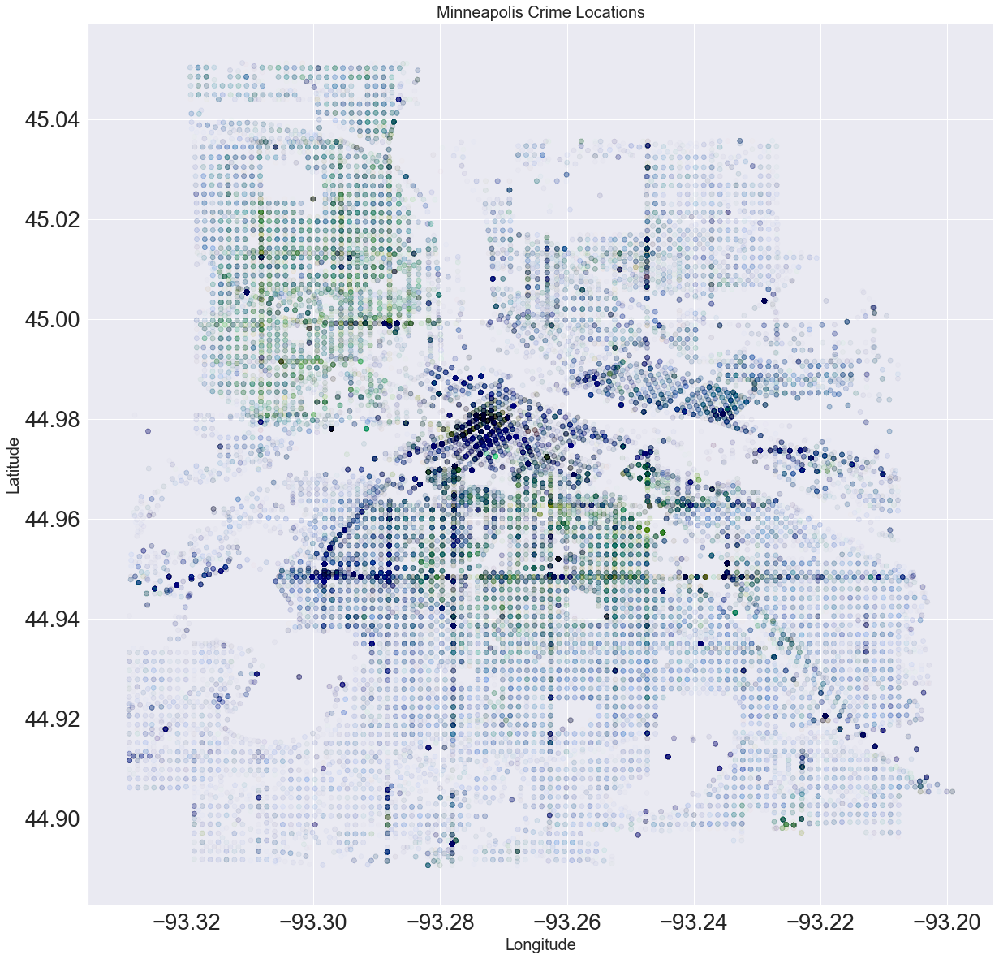

In [ ]:
# Let's drop the outlier for now, since it is skewing our visualization
df.drop(df[df['Long'] == df['Long'].max()].index, inplace=True)

# Assign a color index to each crime category
color_map = dict(zip(crime_category_names, range(len(crime_categories))))

# Draw a scatter plot to show the crimes distribution
fig = plt.figure(figsize=(20,20))
plt.scatter(df.Long, df.Lat, c=df.Category.map(color_map), cmap=plt.cm.gist_ncar, alpha = 0.01)
plt.title("Minneapolis Crime Locations", fontsize=20)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)

# fig.savefig('visualizations/minneapolis_crime_locations_map.png', bbox_inches='tight')

In [ ]:
df = df[['Dates', 'Category', 'Description', 'DayOfWeek', 'Precinct', 'Address', 'Long', 'Lat', 'Hour', 'Month', 'Year']]

In [ ]:
# Plot interactive map for visualization
crimes_map = folium.Map(location=[df['Lat'].mean(), df['Long'].mean()], zoom_start=10)
marker_cluster = MarkerCluster().add_to(crimes_map)

for row in df.values[:5000]:
    popup = "<br> Crime Type: " + row[1] + "<br> Crime Description: " + row[2] + "<br> Date/Time: " + str(row[0])   + "<br> Address: " + row[5] + "</p>"
    folium.Marker([row[7], row[6]], popup=popup).add_to(marker_cluster)

#crimes_map.save('Minneapolis-All-Crimes-Map.html')
crimes_map

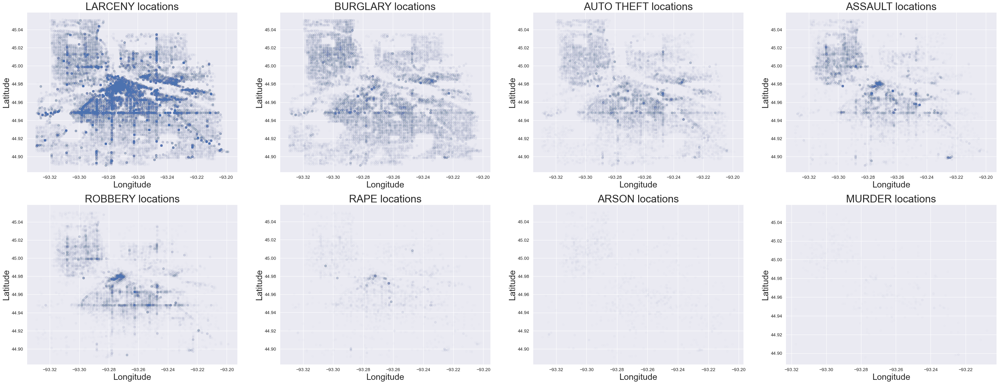

In [ ]:
sns.set(font_scale=1.2)
plot_long_lat_map(df, crime_category_names)

# Summary

- Temporal Features
  - Certain categories of crimes have certain occurences temporally
    - based on `Year`, `DayOfWeek`, `Month`, `Hour`
- Spatial Features
  - Certain categories of crime have higher occurences and density in certain areas
    - based on Longitude & Latitude, and `Neighborhood`
